In [2]:
import imageio
import math
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm
import scipy.signal as sig
import scipy.optimize as optimize
%matplotlib inline

In [3]:
def crop_vertical(image, toprows, botrows):
    return image[toprows:len(image)-botrows]

In [4]:
# image is numpy array 
def rotate_90(image):
    return np.rot90(image, k=3)

In [5]:
def mean_max_min(row):
    center = (row.max() + row.min()) / 2
    flipped_row = (-1*(row - center)) + center
    max_ins = sig.find_peaks(row)
    min_ins = sig.find_peaks(flipped_row)
    mean_max = np.nanmean(row[max_ins[0]])
    mean_min = np.nanmean(row[min_ins[0]])
    return (mean_max, mean_min)

In [6]:
def contrast_ratio(max_val, min_val):
    return (max_val - min_val) / (max_val + min_val)

In [7]:
def calc_dof_len(in_dist, mag, pixel_size):
    return (in_dist * pixel_size) / mag

In [8]:
def median_filter(row, k=5):
    if k % 2 == 0:
        k += 1
    return sig.medfilt(row, k)

In [37]:
def calc_DOF(im, threshold, mag, pixel_size, bin_size, savefig, save_name):
    orig = im
    plt.figure(dpi=150)
    plt.imshow(im, cmap='gray', aspect=1)
    plt.show(block=False)
    
    top_crop_pixels = None
    while (top_crop_pixels != 0):
        top_crop_pixels = int(input("Enter the number of pixels to crop off from top: "))
        im = crop_vertical(im, top_crop_pixels, 0) 
        plt.figure(dpi=150)
        plt.imshow(im, cmap='gray', aspect=1)
        plt.show(block=False)
        
    bot_crop_pixels = None
    while (bot_crop_pixels != 0):
        bot_crop_pixels = int(input("Enter the number of pixels to crop off from bottom: "))
        im = crop_vertical(im, 0, bot_crop_pixels) 
        plt.figure(dpi=150)
        plt.imshow(im, cmap='gray', aspect=1)
        plt.show(block=False)
        
    rotate = int(input("1 to rotate image, 0 to keep the same: "))
    if rotate == 1: 
        im = rotate_90(im)
    plt.figure(dpi=150)
    plt.imshow(im, cmap='gray', aspect=1)
    plt.show(block=False)
        
    contrast_ratios = np.array([contrast_ratio(mean_max_min(row)[0], 
                                               mean_max_min(row)[1]) for row in im])
    smooth_ratios = median_filter(contrast_ratios, bin_size)
    center = (contrast_ratios.max() + contrast_ratios.min()) / 2
    max_index = np.argmax(contrast_ratios)
    max_ratio = contrast_ratios[max_index]   
    min_ins = np.argwhere(contrast_ratios < threshold*max_ratio)
    # get the first indices where the threshold is crossed 
    min_ins = np.array([np.amax(np.where(min_ins<max_index, min_ins, -np.inf)), 
                            np.amin(np.where(min_ins>max_index, min_ins, np.inf))])
    
    plt.figure(dpi=150)
    plt.imshow(orig, cmap='gray', aspect=1)
    plt.axvline(max_index, color='y', linewidth=1)
    plt.plot((smooth_ratios*-1*orig.shape[0])+orig.shape[0], color='r')
    plt.vlines(min_ins, 0, orig.shape[0], color='b', linewidth=1)
    plt.xlim(0, orig.shape[1])
    plt.ylim(orig.shape[0], 0)
    if savefig:
        plt.savefig(save_name, format='pdf', dpi=150)
    plt.show()
    
    pix_len = abs(min_ins[1] - min_ins[0])
    
    dof = calc_dof_len(pix_len, mag, pixel_size)
    print("DOF in mm: ", dof)
    return dof

In [55]:
def calc_DOF(im, thresholds, mag, pixel_size, bin_size, savefig, save_name):
    orig = im
    plt.figure(dpi=150)
    plt.imshow(im, cmap='gray', aspect=1)
    plt.show(block=False)
    
    top_crop_pixels = None
    while (top_crop_pixels != 0):
        top_crop_pixels = int(input("Enter the number of pixels to crop off from top: "))
        im = crop_vertical(im, top_crop_pixels, 0) 
        plt.figure(dpi=150)
        plt.imshow(im, cmap='gray', aspect=1)
        plt.show(block=False)
        
    bot_crop_pixels = None
    while (bot_crop_pixels != 0):
        bot_crop_pixels = int(input("Enter the number of pixels to crop off from bottom: "))
        im = crop_vertical(im, 0, bot_crop_pixels) 
        plt.figure(dpi=150)
        plt.imshow(im, cmap='gray', aspect=1)
        plt.show(block=False)
        
    rotate = int(input("1 to rotate image, 0 to keep the same: "))
    if rotate == 1: 
        im = rotate_90(im)
    plt.figure(dpi=150)
    plt.imshow(im, cmap='gray', aspect=1)
    plt.show(block=False)
        
    contrast_ratios = np.array([contrast_ratio(mean_max_min(row)[0], 
                                               mean_max_min(row)[1]) for row in im])
    smooth_ratios = median_filter(contrast_ratios, bin_size)
    center = (contrast_ratios.max() + contrast_ratios.min()) / 2
    max_index = np.argmax(contrast_ratios)
    max_ratio = contrast_ratios[max_index]
    
    for threshold in thresholds:
        min_ins = np.argwhere(contrast_ratios < threshold*max_ratio)
        # get the first indices where the threshold is crossed 
        min_ins = np.array([np.amax(np.where(min_ins<max_index, min_ins, -np.inf)), 
                                np.amin(np.where(min_ins>max_index, min_ins, np.inf))])

        plt.figure(dpi=150)
        plt.imshow(orig, cmap='gray', aspect=1)
        plt.axvline(max_index, color='y', linewidth=1)
        plt.plot((smooth_ratios*-1*orig.shape[0])+orig.shape[0], color='r')
        plt.vlines(min_ins, 0, orig.shape[0], color='b', linewidth=1)
        plt.xlim(0, orig.shape[1])
        plt.ylim(orig.shape[0], 0)
        if savefig:
            plt.savefig(save_name % int(threshold*100), format='pdf', dpi=150)
        plt.show()

        pix_len = abs(min_ins[1] - min_ins[0])

        dof = calc_dof_len(pix_len, mag, pixel_size)
        print("DOF in mm: ", dof)
    # return dof

/tmp/ipykernel_45443/1170255322.py:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f"{data_dir}/{file}", as_gray=True)


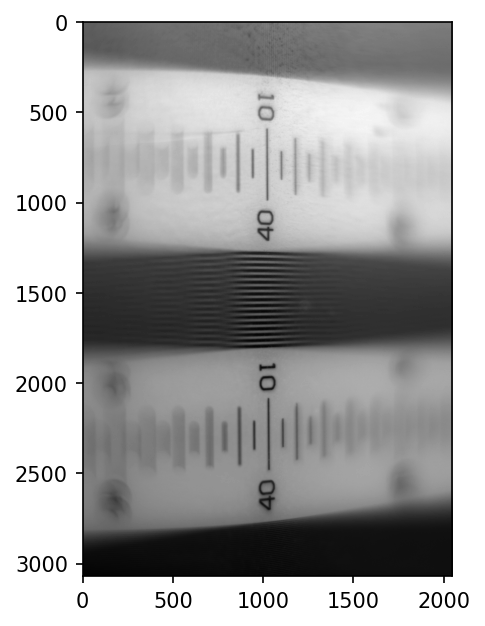

Enter the number of pixels to crop off from top:  1300


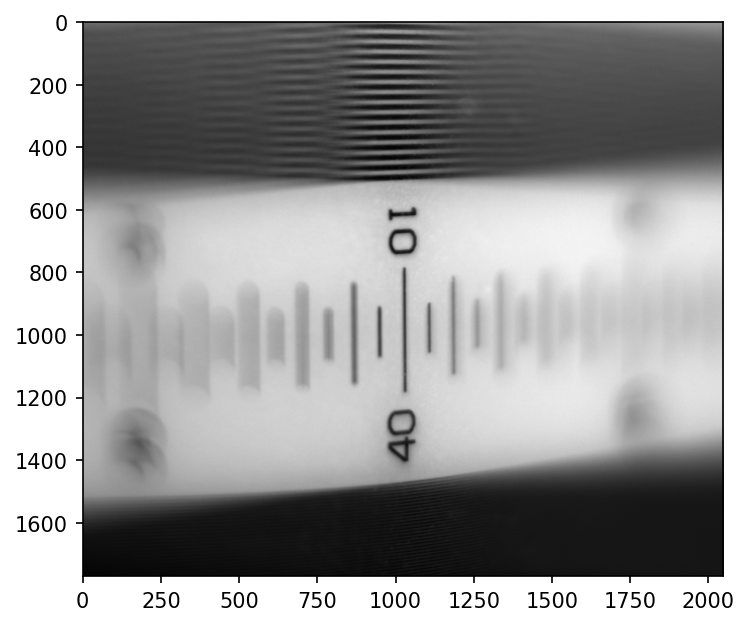

Enter the number of pixels to crop off from top:  0


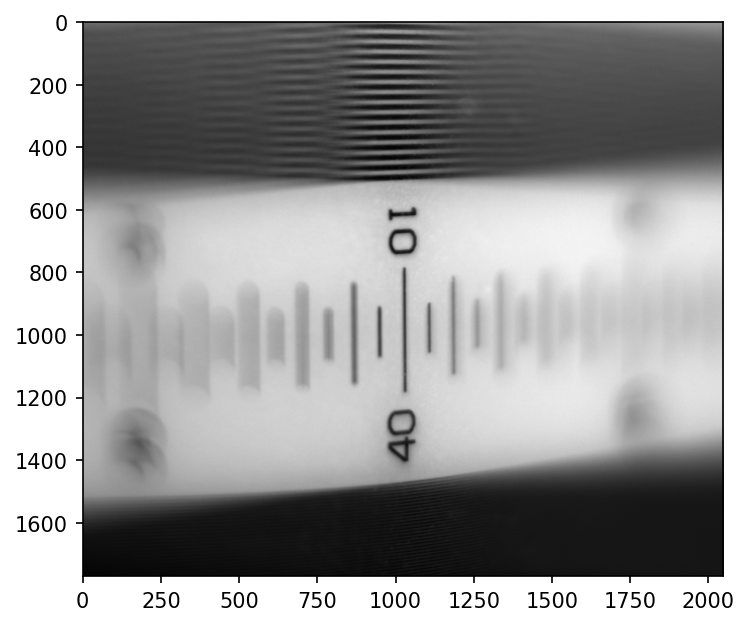

Enter the number of pixels to crop off from bottom:  1200


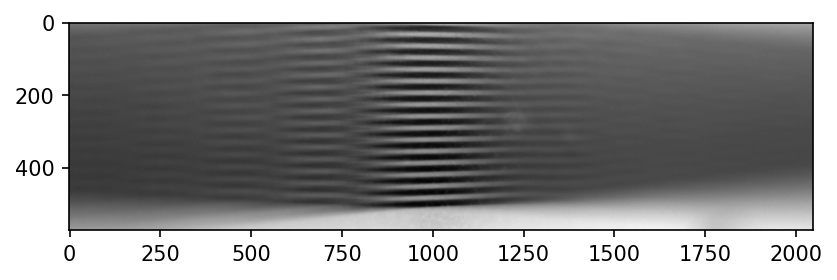

Enter the number of pixels to crop off from bottom:  100


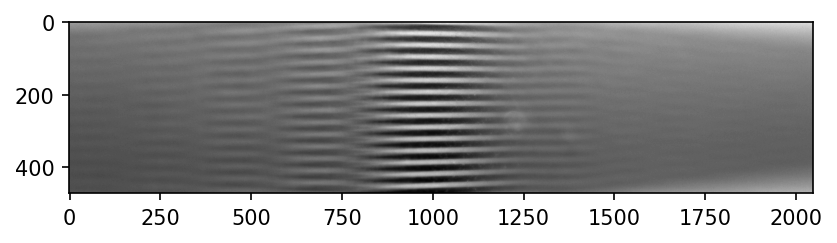

Enter the number of pixels to crop off from bottom:  0


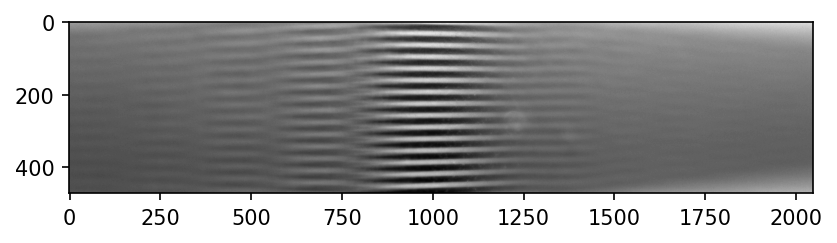

1 to rotate image, 0 to keep the same:  1


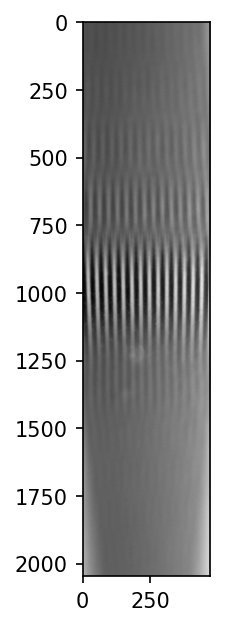

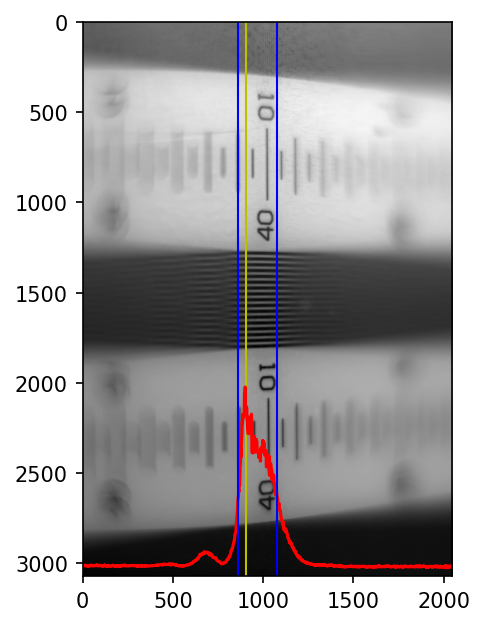

DOF in mm:  1.2193995381062355


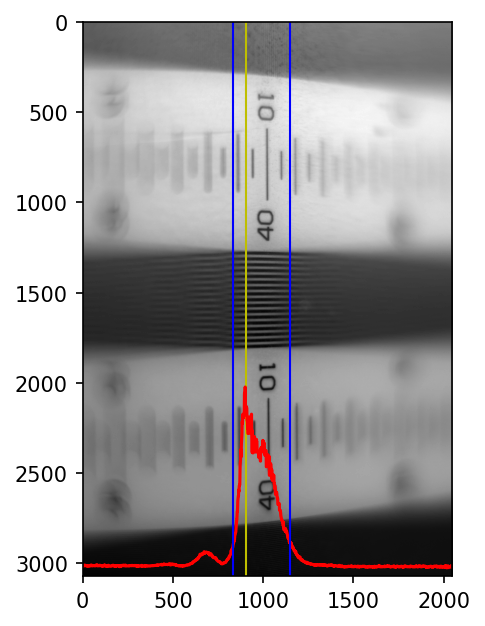

DOF in mm:  1.751501154734411


/tmp/ipykernel_45443/1170255322.py:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f"{data_dir}/{file}", as_gray=True)


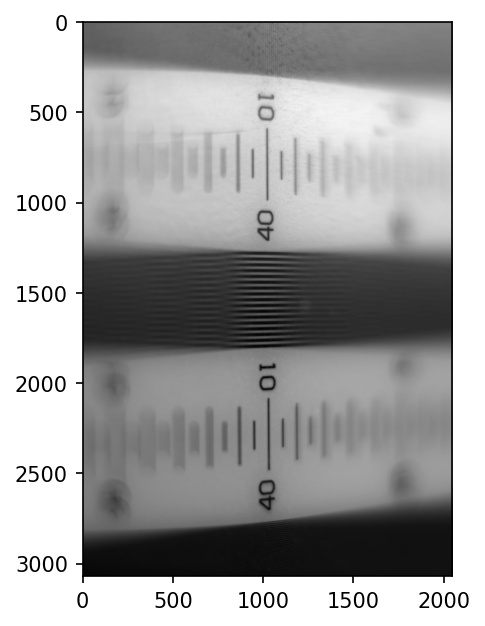

Enter the number of pixels to crop off from top:  1300


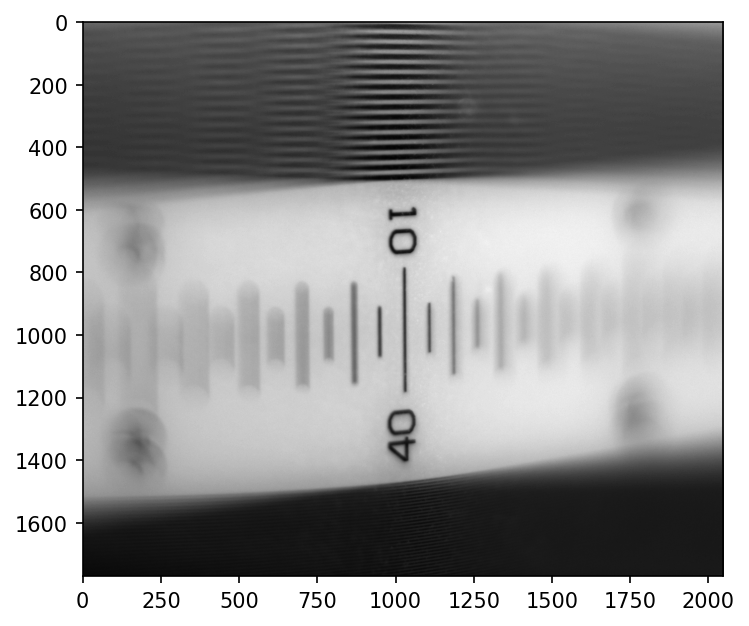

Enter the number of pixels to crop off from top:  0


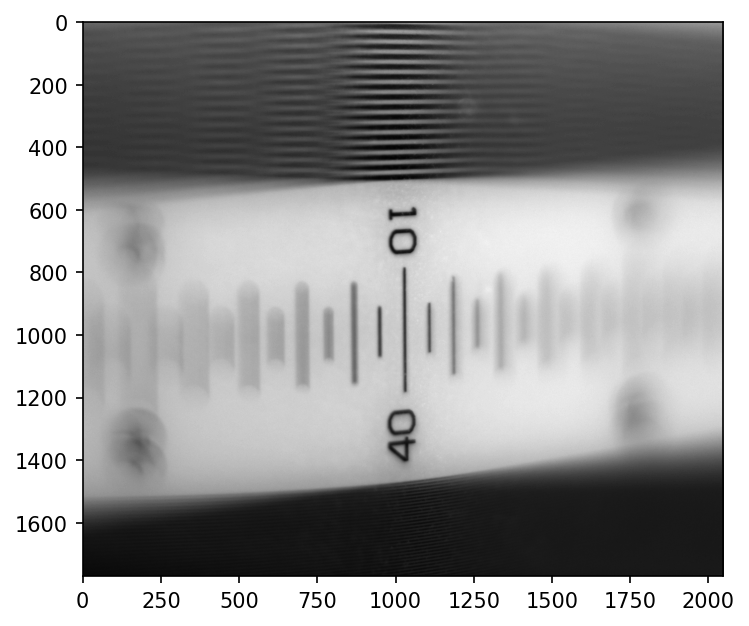

Enter the number of pixels to crop off from bottom:  1300


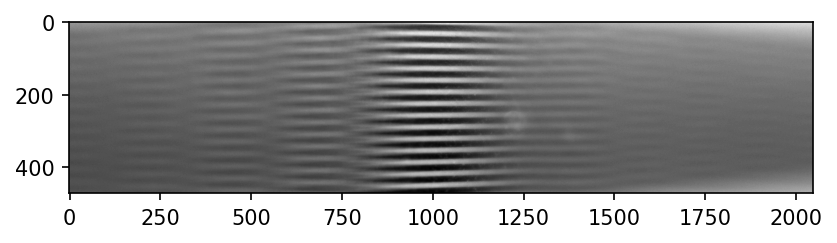

Enter the number of pixels to crop off from bottom:  0


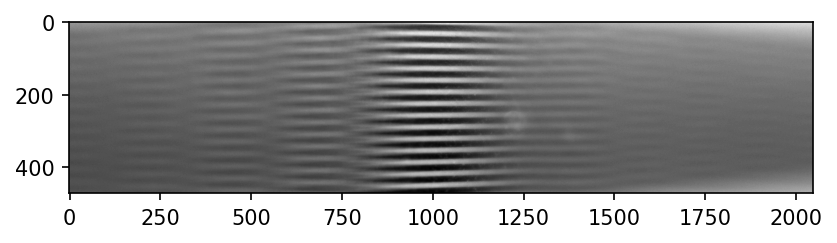

1 to rotate image, 0 to keep the same:  1


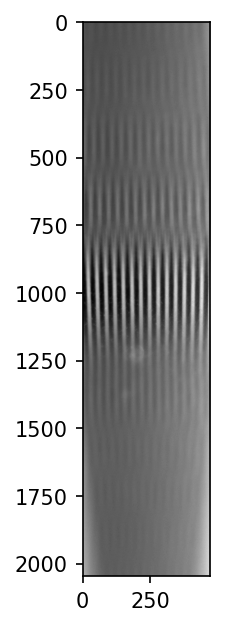

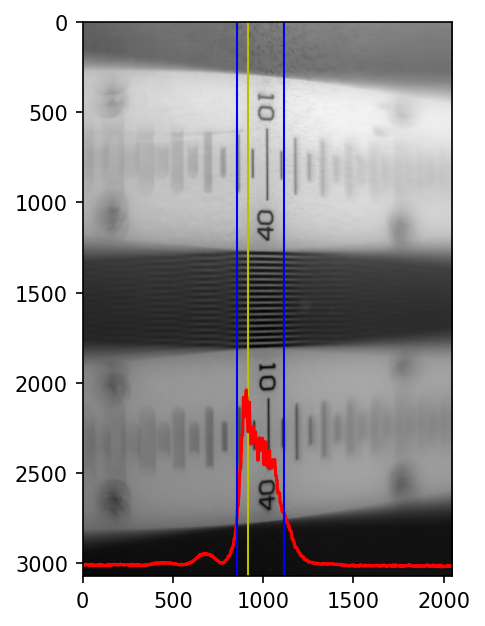

DOF in mm:  1.4189376443418014


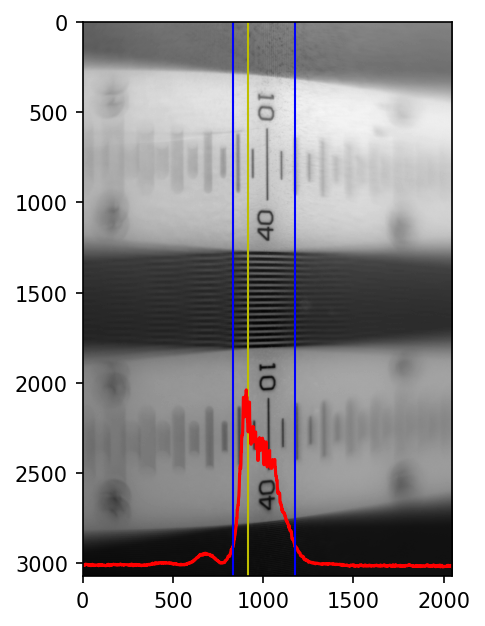

DOF in mm:  1.8789838337182445


/tmp/ipykernel_45443/1170255322.py:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f"{data_dir}/{file}", as_gray=True)


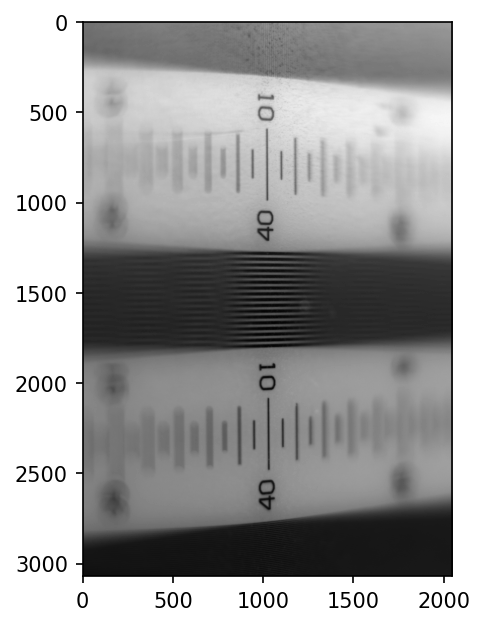

Enter the number of pixels to crop off from top:  1300


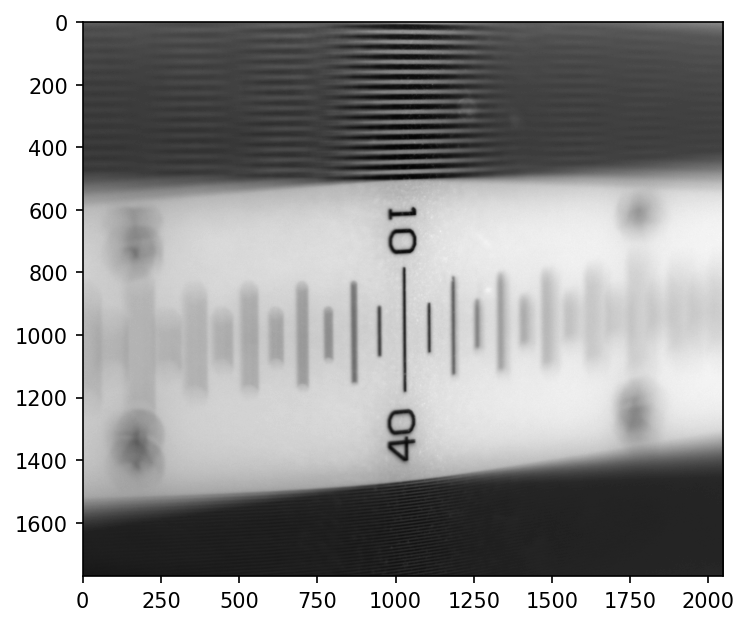

Enter the number of pixels to crop off from top:  0


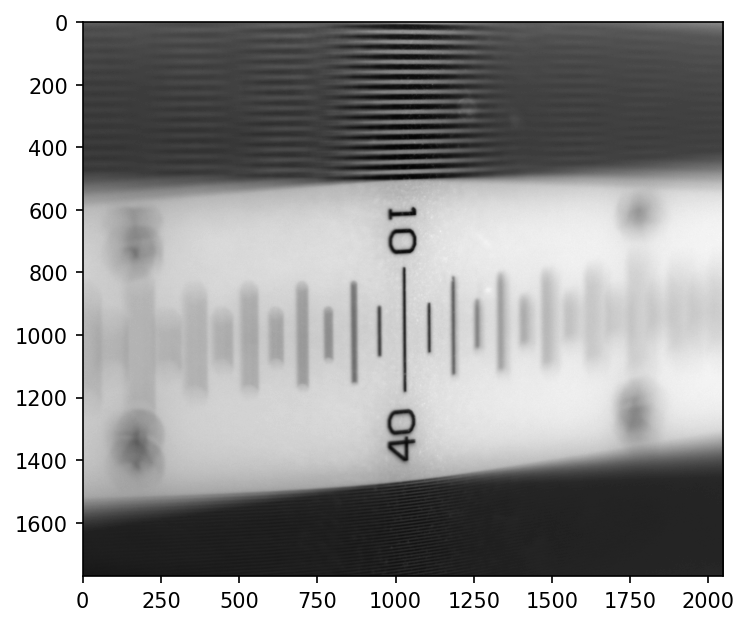

Enter the number of pixels to crop off from bottom:  1300


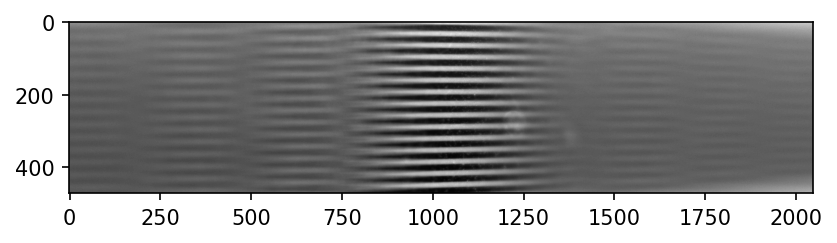

Enter the number of pixels to crop off from bottom:  0


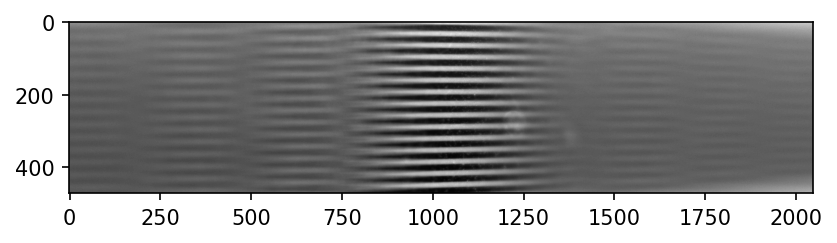

1 to rotate image, 0 to keep the same:  1


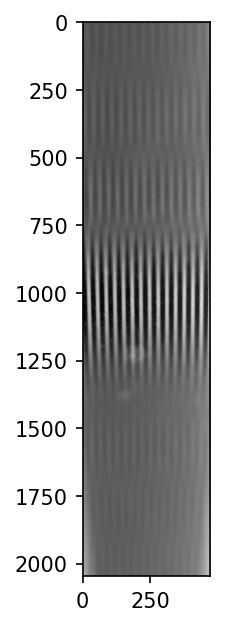

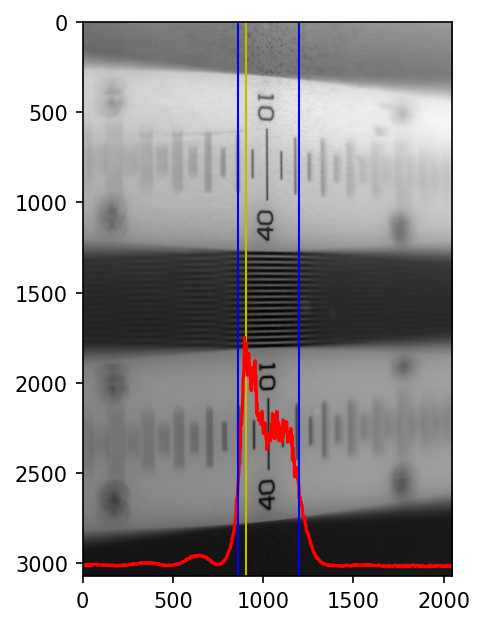

DOF in mm:  1.8734411085450344


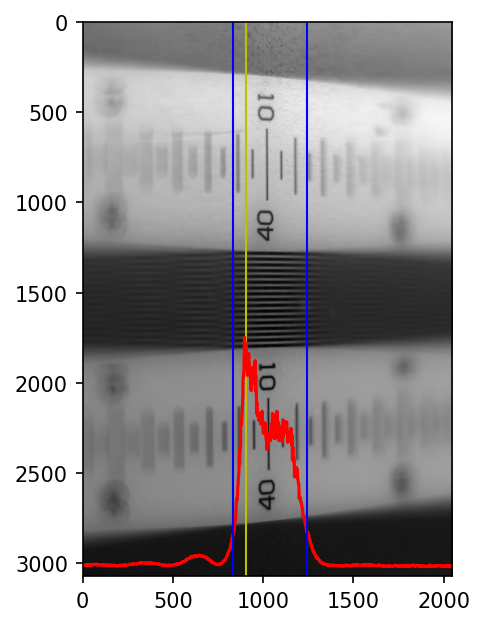

DOF in mm:  2.2780600461893763


/tmp/ipykernel_45443/1170255322.py:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f"{data_dir}/{file}", as_gray=True)


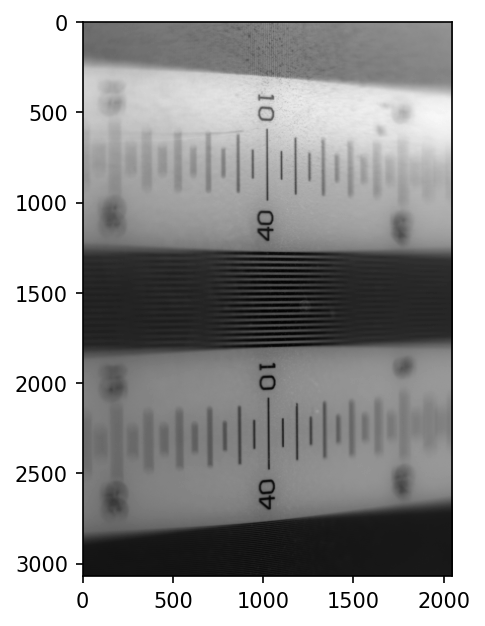

Enter the number of pixels to crop off from top:  1300


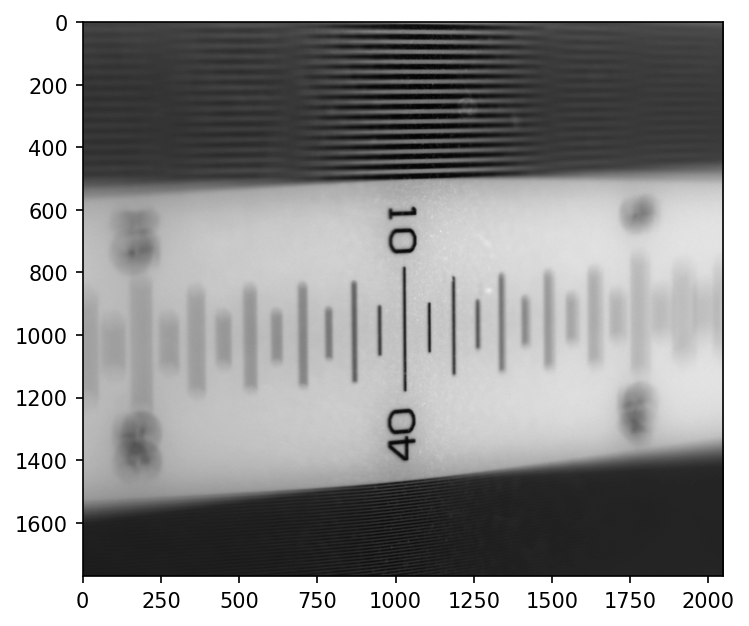

Enter the number of pixels to crop off from top:  0


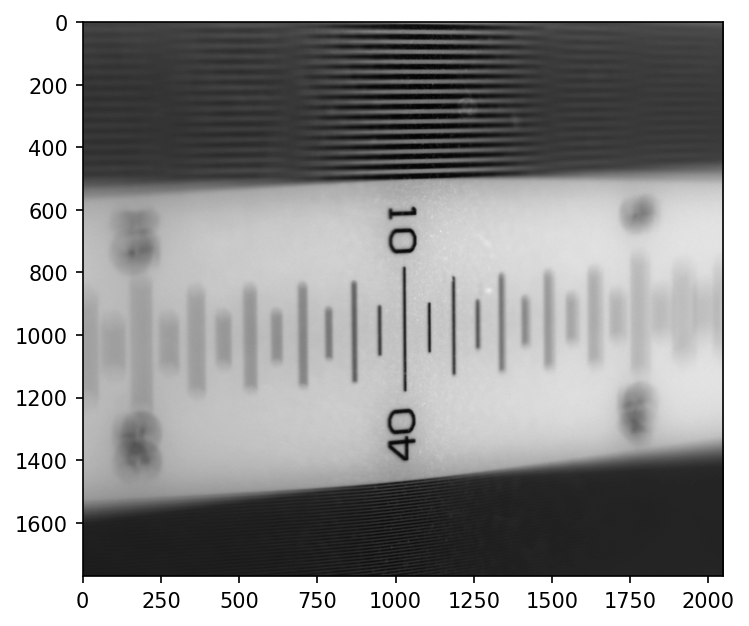

Enter the number of pixels to crop off from bottom:  1300


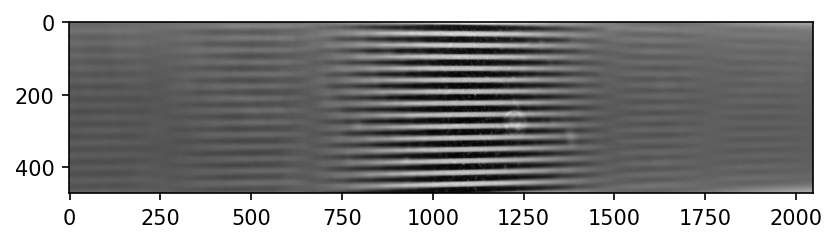

Enter the number of pixels to crop off from bottom:  0


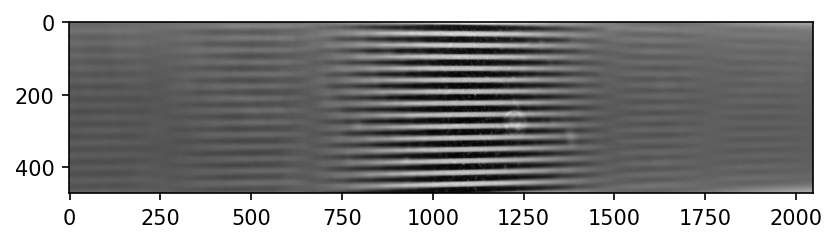

1 to rotate image, 0 to keep the same:  1


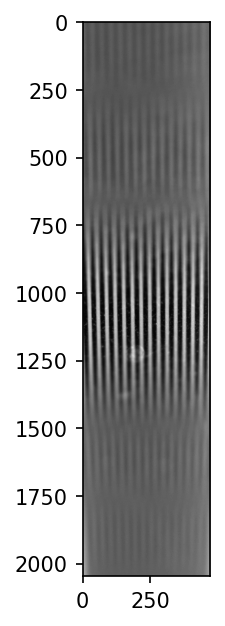

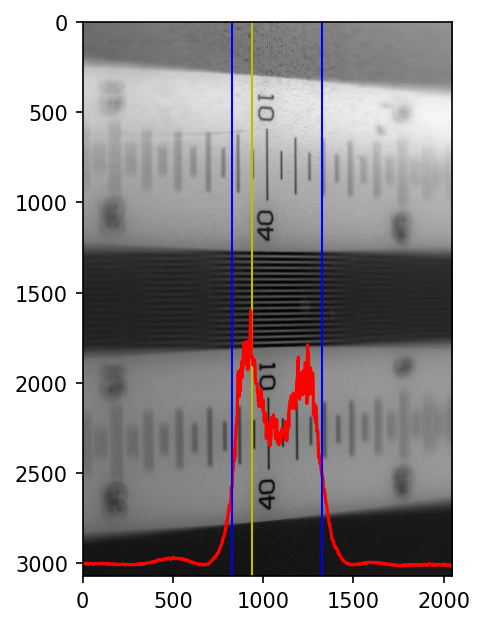

DOF in mm:  2.7658198614318708


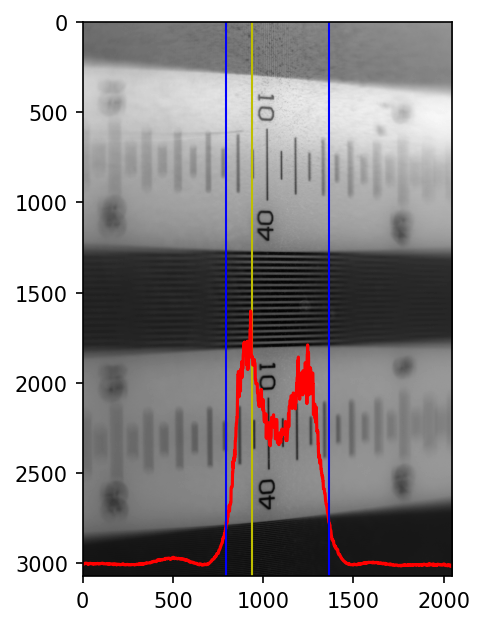

DOF in mm:  3.164896073903002


/tmp/ipykernel_45443/1170255322.py:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f"{data_dir}/{file}", as_gray=True)


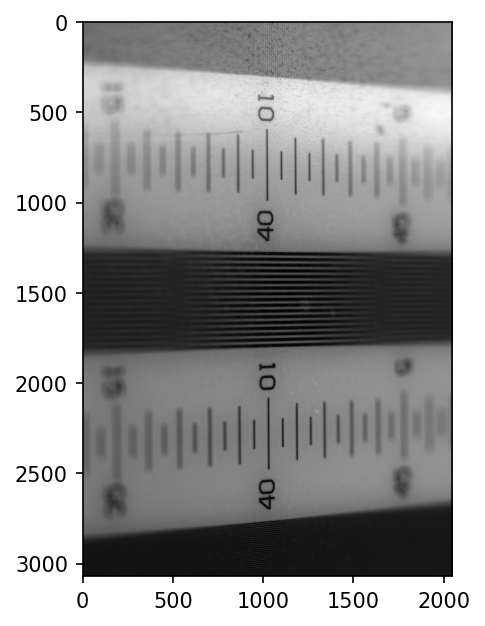

Enter the number of pixels to crop off from top:  1300


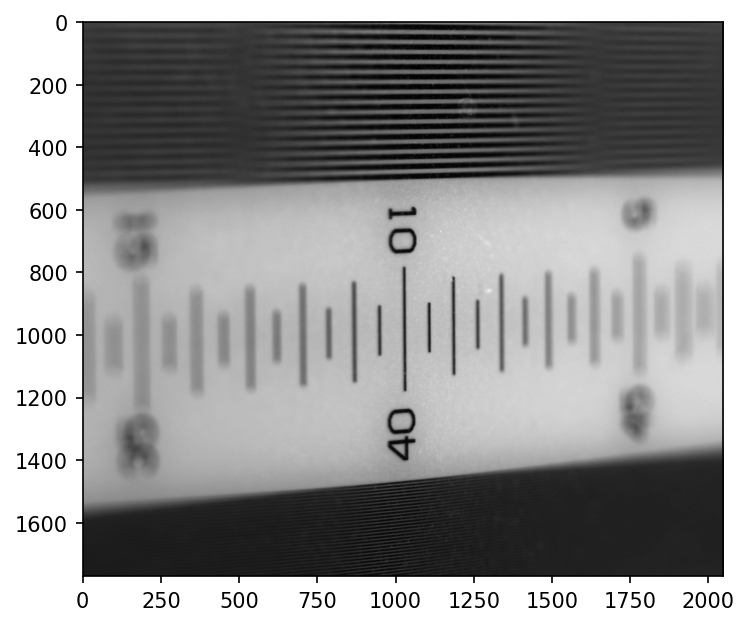

Enter the number of pixels to crop off from top:  0


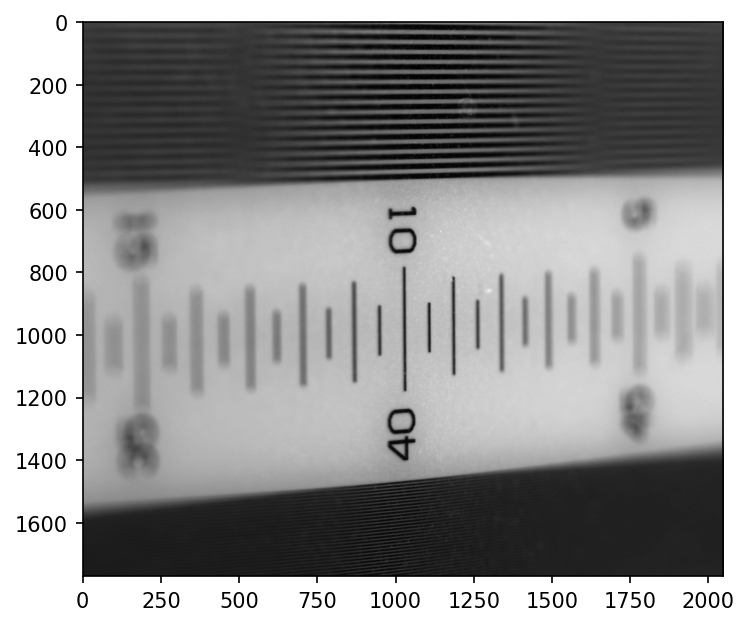

Enter the number of pixels to crop off from bottom:  1300


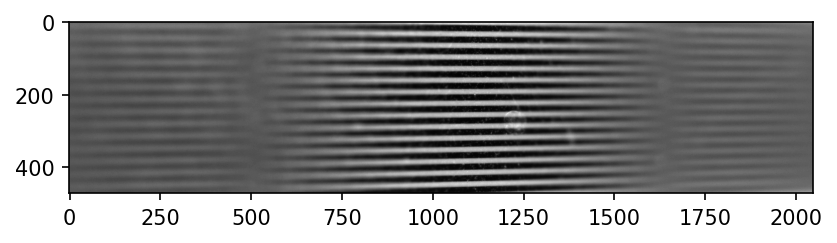

Enter the number of pixels to crop off from bottom:  0


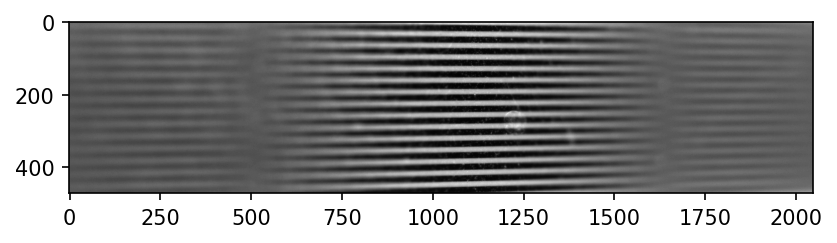

1 to rotate image, 0 to keep the same:  1


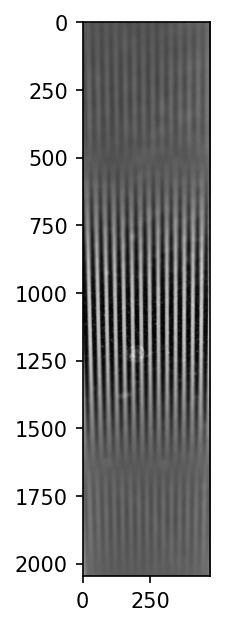

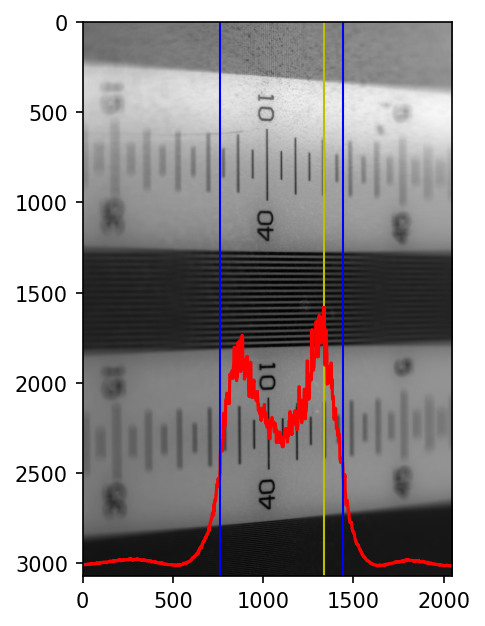

DOF in mm:  3.78568129330254


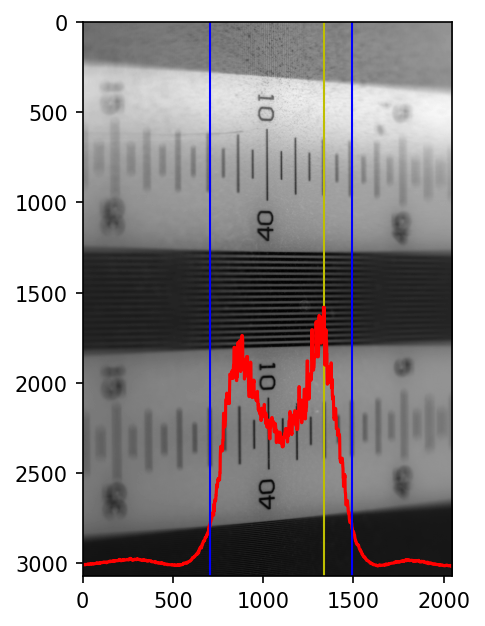

DOF in mm:  4.339953810623556


/tmp/ipykernel_45443/1170255322.py:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f"{data_dir}/{file}", as_gray=True)


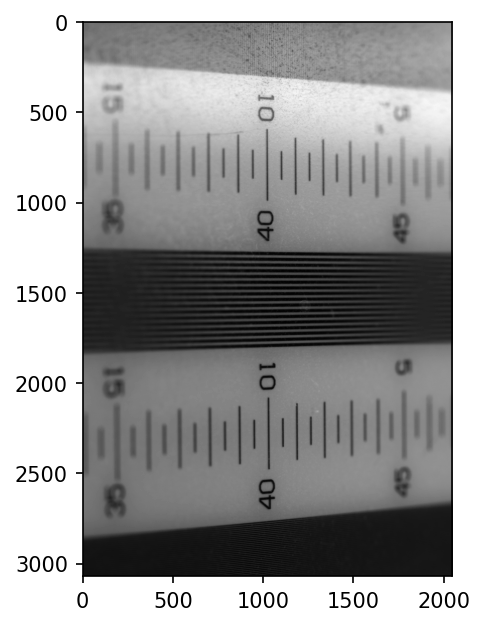

Enter the number of pixels to crop off from top:  1300


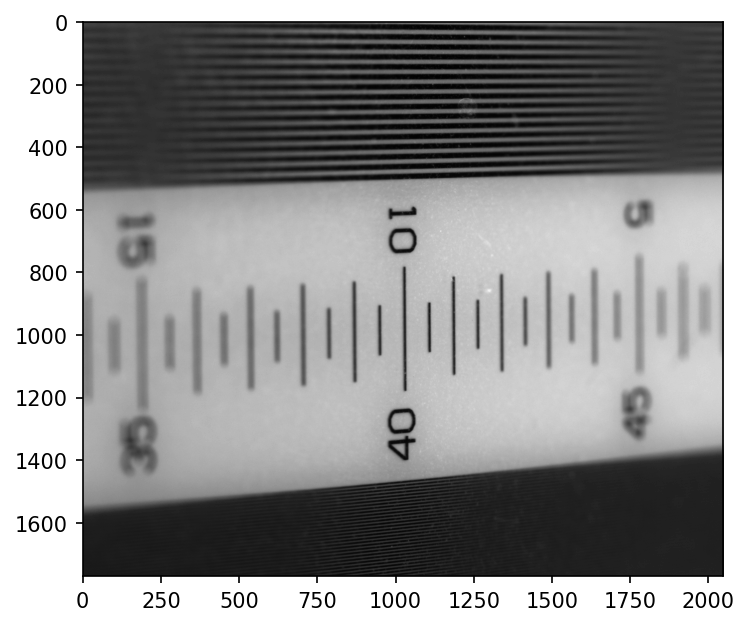

Enter the number of pixels to crop off from top:  0


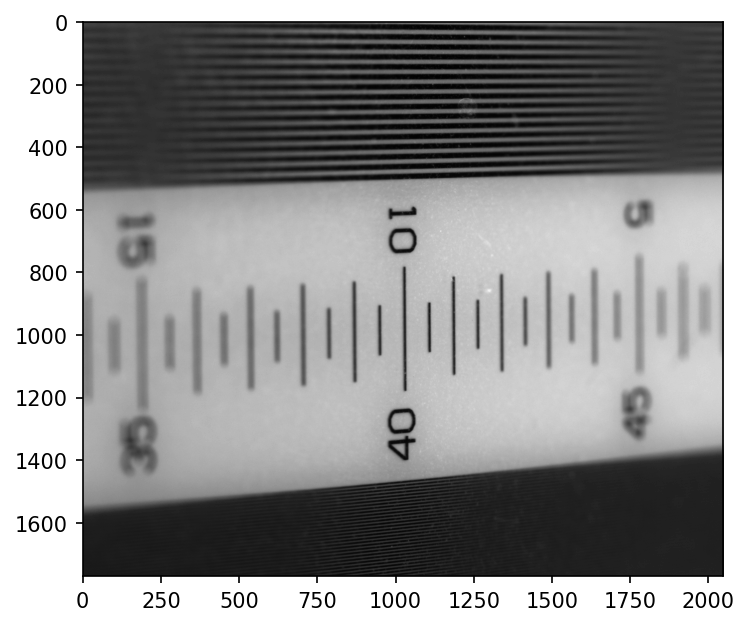

Enter the number of pixels to crop off from bottom:  1300


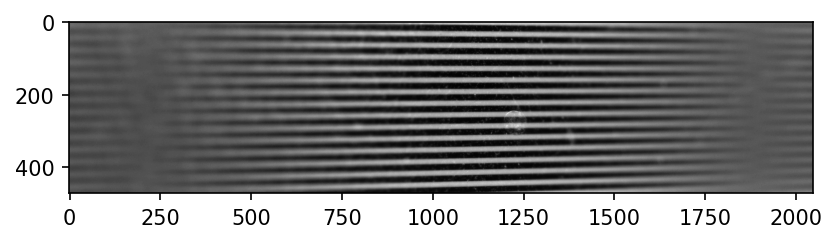

Enter the number of pixels to crop off from bottom:  0


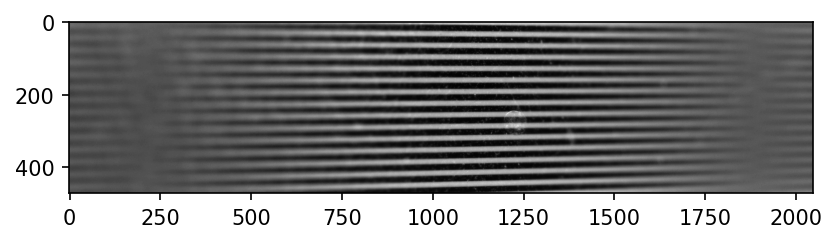

1 to rotate image, 0 to keep the same:  1


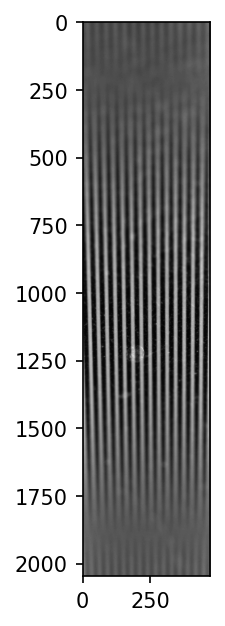

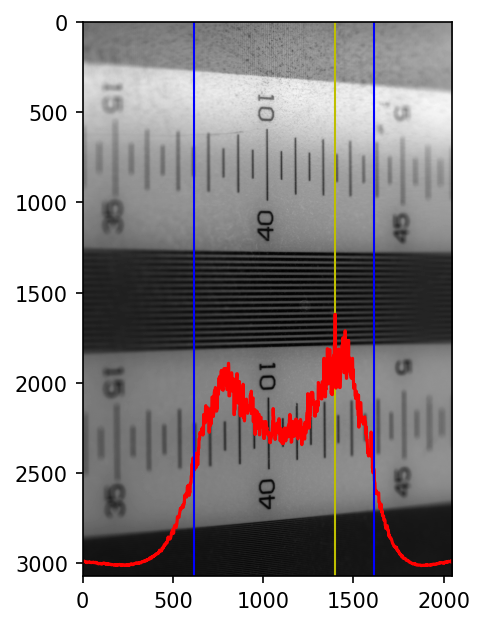

DOF in mm:  5.5316397228637415


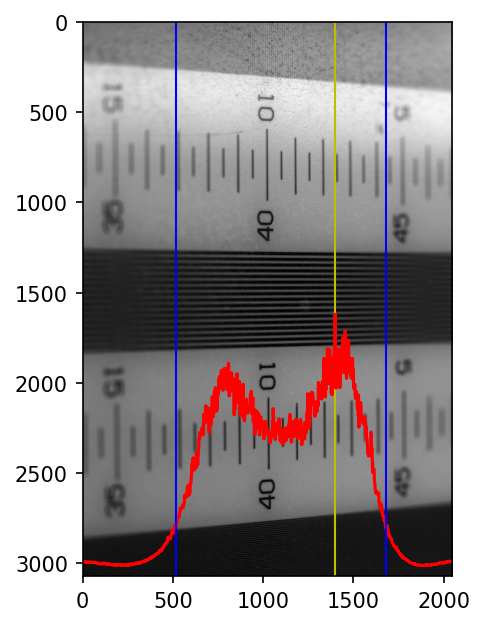

DOF in mm:  6.435103926096997


/tmp/ipykernel_45443/1170255322.py:24: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(f"{data_dir}/{file}", as_gray=True)


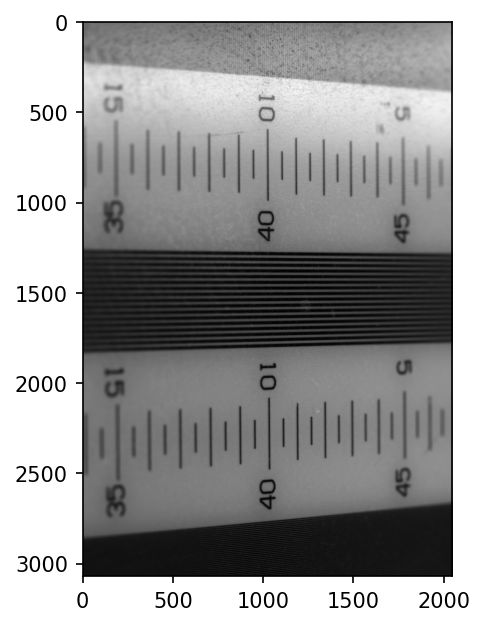

Enter the number of pixels to crop off from top:  1300


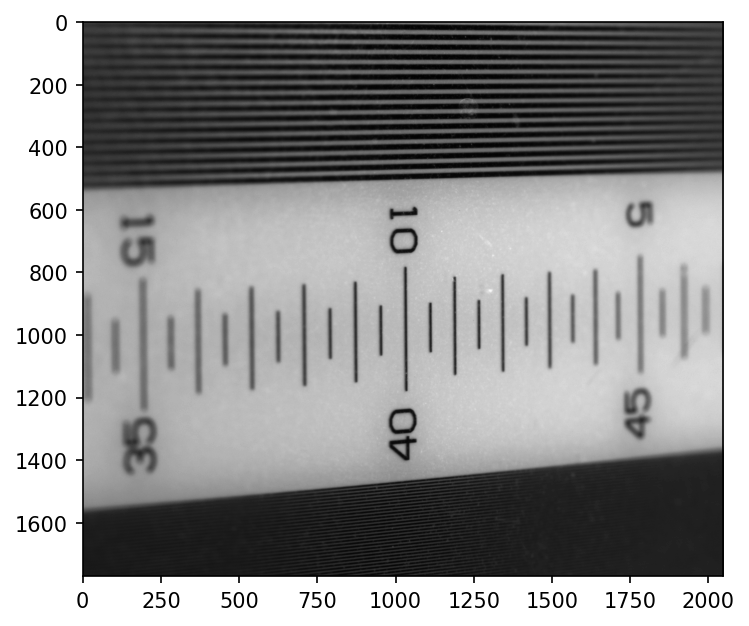

Enter the number of pixels to crop off from top:  0


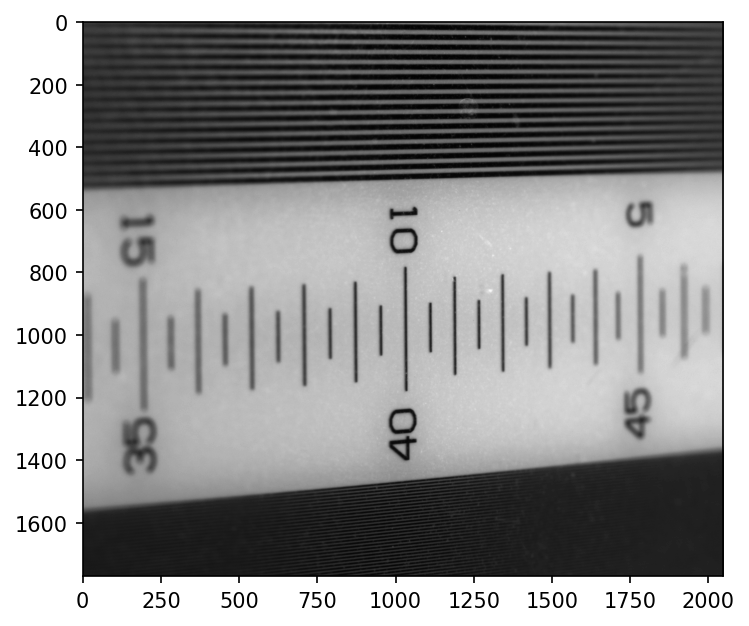

Enter the number of pixels to crop off from bottom:  1300


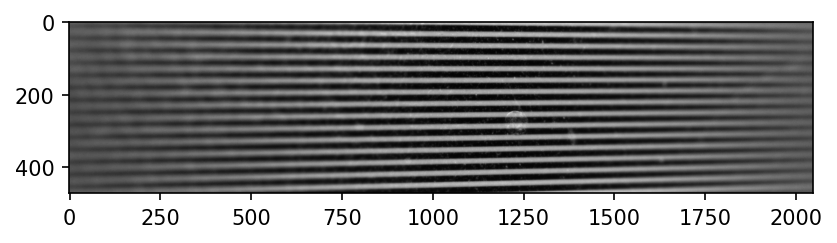

Enter the number of pixels to crop off from bottom:  0


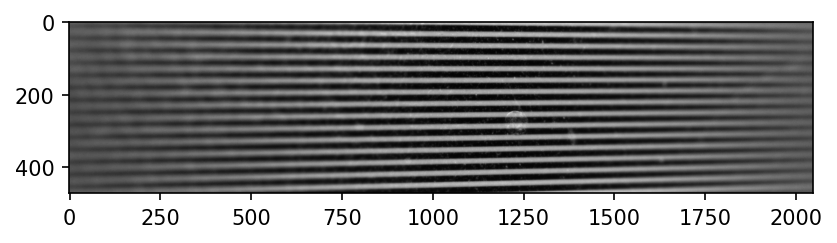

1 to rotate image, 0 to keep the same:  1


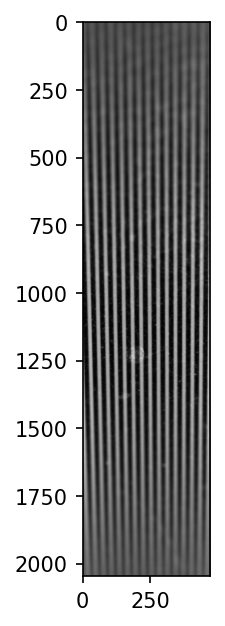

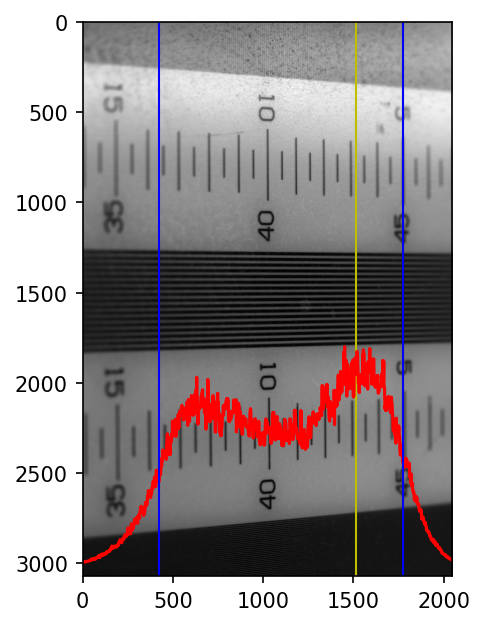

DOF in mm:  7.521478060046189


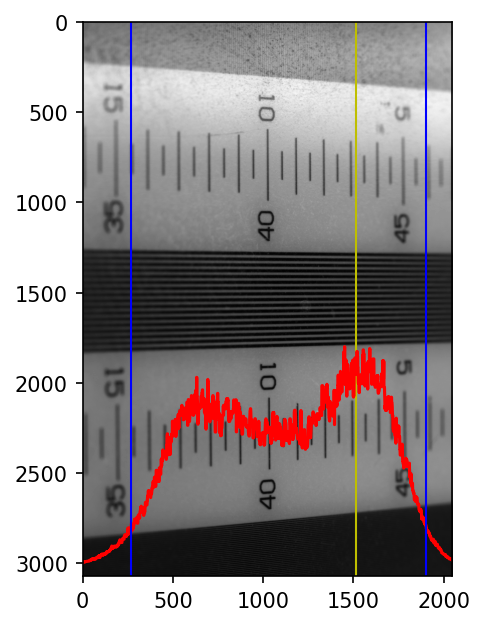

DOF in mm:  9.062355658198614


In [60]:
# data_dir = "/home/sanha/immanuel/research/magis/data/DIS/lab/20230125"

WD = 65
f_numbers = [
    "1p4",
    "1p6",
    "2p0",
    "2p8",
    "4p0",
    "5p6",
    "8p0"
]

file_dict = {
    f_number: f"20220125_dof_25mm_f{f_number}_WD{WD}mm_001.png" for f_number in f_numbers
}

thresholds = [0.3, 0.15]
mag = 0.433
pixel_size = 0.0024
bin_size = 6

for f_number, file in file_dict.items():
    image = imageio.imread(f"{data_dir}/{file}", as_gray=True)
    calc_DOF(rotate_90(image), thresholds, mag, pixel_size, bin_size, True,
             f"results/DOF_image_f{f_number}_WD{WD}mm_thres%d.pdf")